<a href="https://colab.research.google.com/github/AkshayCodeLab/Dog-Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to End Multi-Class Dog Breed Classification

Building an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data used here is from Kaggle's do breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog of each test image.

## 4. Features

Some information about the data:
* Dealing with unstructued image data so it's best to use deep learning/ transfer learning.
* Multi-class classification problem: There are 120 dog breeds to classify.
* 10,000 labelled images in training set.
* 10,000 unlabelled images in test set.

In [ ]:
# Unzipping google drive data
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

## Getting our workspace ready

* Importing TensorFlow
* Importing TesorFlow Hub
* Making sure we're using a GPU for faster processing of large data.

In [132]:
# Import Necessary tools
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
print("TF version: ", tf.__version__)
print("TF HUB version: ", hub.__version__)

# Check for GPU
print("GPU available" if tf.config.list_physical_devices("GPU") else "GPU not available")

TF version:  2.12.0
TF HUB version:  0.13.0
GPU available


## Getting our data ready (Turning into Tensors)

We need to turn our images into Tensors (numerical representation) for our Machine Learning models to work.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


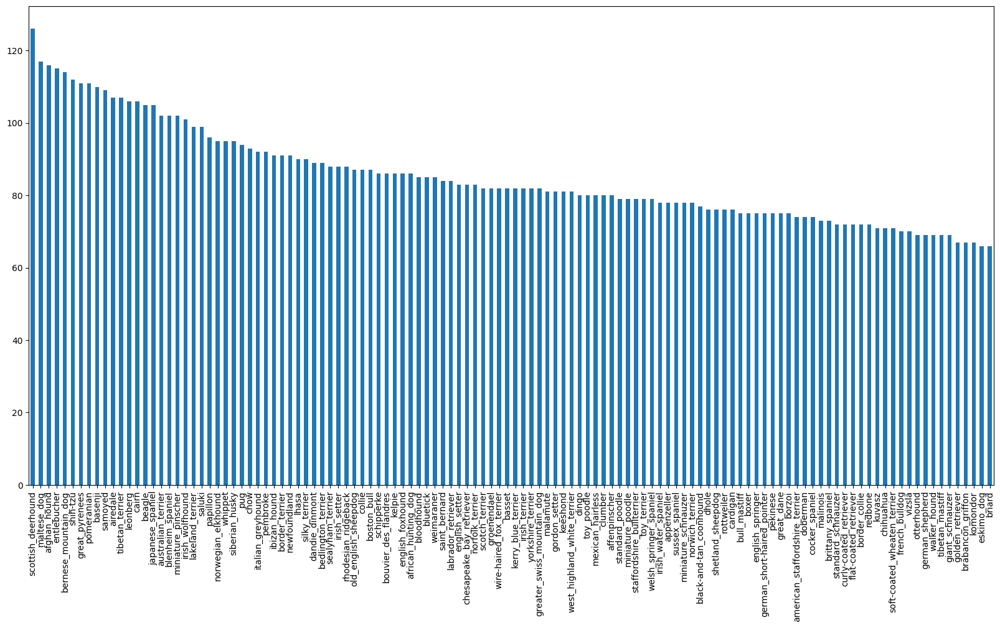

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
# Median number of images per class ?
labels_csv["breed"].value_counts().median()

82.0

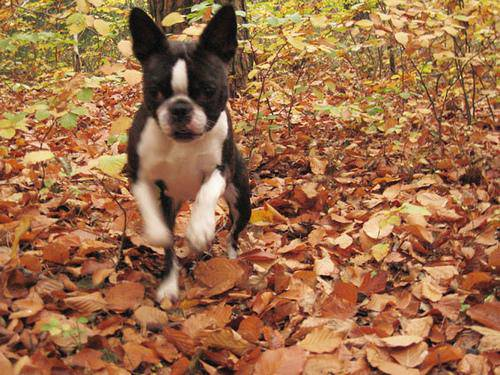

In [ ]:
# View an image in colab
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting Images and their labels

Getting a list of our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs

filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches the number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenmaes do not match actual amoung of files")

Filenames match actual amount of files


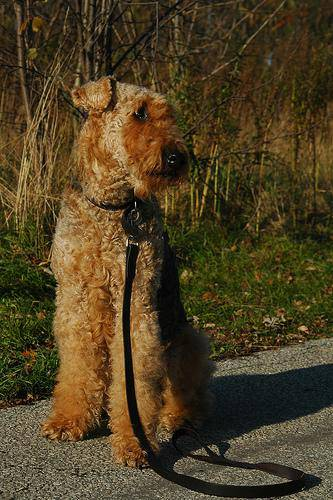

In [ ]:
# One last check
Image(filenames[5000])

Since we've now got our training image filepaths in a list, let
s prepare labels.

In [ ]:
labels= labels_csv["breed"]
labels= np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches filenames")
else:
    print("Number of labels does not match filenames")

Number of labels matches filenames


In [ ]:
# find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
 # Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own Validation Set


In [ ]:
# Setup X and Y variabls
X = filenames
y= boolean_labels


In [ ]:
len(filenames)

10222

We're going to start off experimenting 1000 images and increase as needed to reduce the experimentation time

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min : 1000, max :  10000, step: 1000}


In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size= 0.2,
                                                    random_state= 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing Images (turning images into Tensors)

Tp preprocess our image into Tensors we're going to write a function which does:

1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our image (a jpg) to Tensors
4. Normalize our image (convert colour channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224, 224)
6. Return the modified image.

Let's see how importing an image looks like.

In [ ]:
# Convert an image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

Now we've seen how an image looks like in tensor, let's preprocess them.

In [133]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size= IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """

  # Read an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert eh colour channel value from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image of our desired size
  image = tf.image.resize(image, size= [img_size, img_size])

  return image

## Turning our data into batches

Why turn our data into batches ?

If we try to process 10,000 images in one go then they all might not fit into memory.

So, that's why we do about 32 (batch size) images at a time (batch size can we adjusted manually as per the need)


In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:

  `(image, label)`

In [134]:
# Create simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  preprocesses the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we,ve got a way to turn our data into tuples of Tensors in the form (image, label), let's make a function to turn all our data into batches.

In [135]:
# Define the batch size = 32
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size= BATCH_SIZE, valid_data= False, test_data= False):
  """
  Create batches of data out of image (X) and label (Y) pairs.
  Shuffles the training data but doesn't shuffles the validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test data (no labels):
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch


  # If the data is a valid dataset, we dont' need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")

    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                              tf.constant(y))) # Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating Training Data Batches...")

    # Turn filepaths and labels int tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before applying image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create (image , label) tuples (this also turns image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [ ]:
# Creating training and validation batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data= True)

Creating Training Data Batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, these can be a little hard to understand, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize= (10, 10))
  # Loop through 25 (for displaying 25 images)

  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Un-batch the data out of all the batches in train_data
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

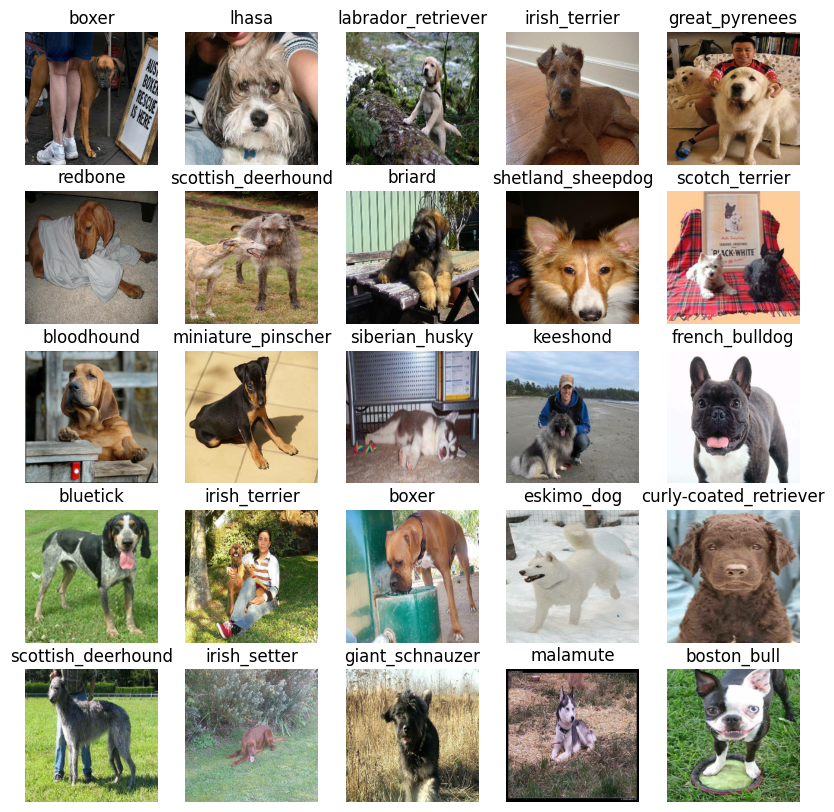

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

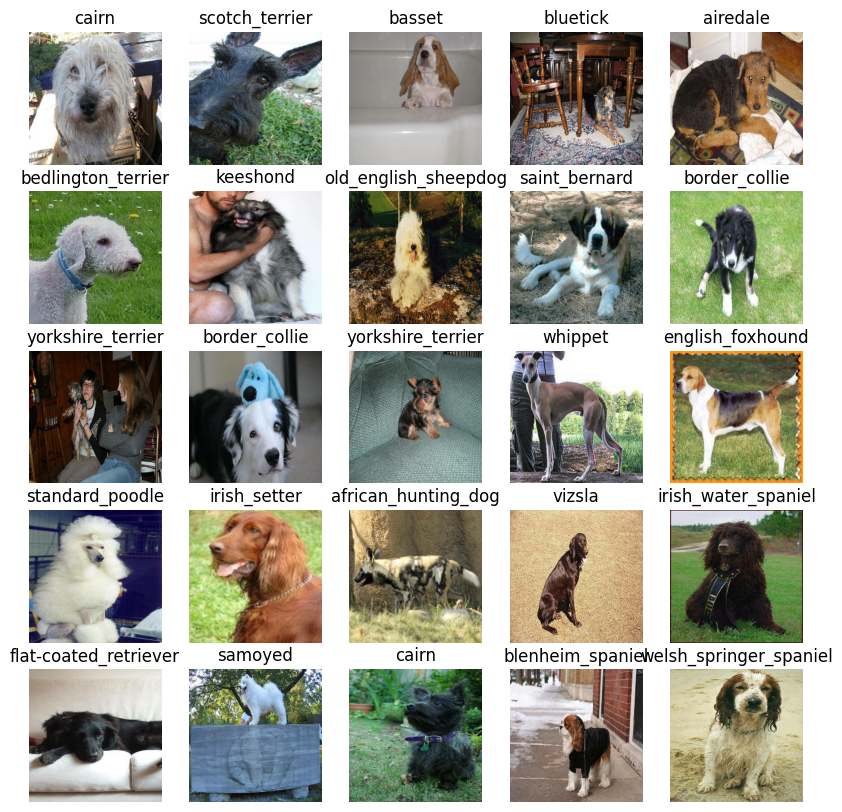

In [ ]:
# Now let's visualize our validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, few things we need to define:

* The input shape (our image in the form of Tensors) to our model
* The output shape(image labels in the form of Tensors) to our model
* The URL of the model we want to use from TensorFlow Hub

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs, and model ready.
Let's put them together into a Keras deeplearning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion.
* Compiles the model (says it should be evaluated and improved)
* Build the model (tells the model the input shape)
* Returns the model.

Source: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building Model with:", MODEL_URL)

  # Setup the model layers
  model= tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units= OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics= ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model= create_model()
model.summary()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save it's progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early sopping which prevents our model from training too long.

### Tensorboard Callback

To setip a Tensorboard callback, we need to do 3 things:
1. Load the Tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs.
3. Visualize our models training logs with the `%tensorboard` magic function.

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir= os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                       # Make it so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping prevents our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Createe early stopping callback
early_stopping= tf.keras.callbacks.EarlyStopping(monitor= "val_accuracy",
                                                 patience= 3)


## Training a model on subset of data

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min : 10, max: 100, step : 10}


In [ ]:
# Check to make sure we're still running on a GPU

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup TensorBoard callback using `create_`tensorboard`callback()
* Call the `fit()` function on our model passing it training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model.


In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x= train_data,
            epochs= NUM_EPOCHS,
            validation_data= val_data,
            validation_freq= 1,
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 18s 160ms/step - loss: 4.4991 - accuracy: 0.0988 - val_loss: 3.4790 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 4s 151ms/step - loss: 1.5864 - accuracy: 0.7025 - val_loss: 2.1704 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 5s 191ms/step - loss: 0.5508 - accuracy: 0.9400 - val_loss: 1.6747 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2525 - accuracy: 0.9837 - val_loss: 1.4936 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 4s 151ms/step - loss: 0.1429 - accuracy: 1.0000 - val_loss: 1.4170 - val_accuracy: 0.5950
Epoch 6/100
25/25 [==============================] - 3s 123ms/step - loss: 0.1003 - accuracy: 1.0000 - val_loss: 1.3825 - val_accuracy: 0.6100
Epoch 7/100
25/25 [=============================

### Checking the TensorBoard Logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visaulize it's contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model.

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used for training)
predictions = model.predict(val_data, verbose = 1)

7/7 [==============================] - 1s 94ms/step


In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
# Gives the probability associated to every breed in our unique_breed set. The breed with the highest probability here is the predicted breed.
predictions[0]

# We used softmax activation while model building that's why getting it in the range of 0-1

array([6.82284078e-03, 6.90535991e-04, 2.14993441e-03, 2.06896235e-04,
       2.28489793e-04, 5.86654496e-05, 1.58940293e-02, 6.74674811e-04,
       3.82739599e-05, 7.11336383e-04, 3.47466266e-04, 2.89561722e-04,
       1.93503234e-04, 3.84073704e-04, 7.78685499e-04, 1.50240841e-04,
       7.33536668e-04, 3.02279204e-01, 1.76056765e-05, 3.49919894e-04,
       2.80387321e-04, 1.03174956e-04, 1.75784135e-05, 2.21412163e-03,
       3.82056569e-05, 6.81927850e-05, 7.86711052e-02, 9.56601361e-05,
       2.73134420e-03, 5.63562789e-04, 1.04355408e-04, 1.49082532e-03,
       7.11445318e-05, 7.17336370e-05, 1.48763051e-04, 9.90783349e-02,
       4.38312927e-05, 3.01607797e-04, 1.55966132e-04, 4.17810516e-04,
       2.24131090e-03, 1.73438038e-05, 4.55935078e-05, 1.25567021e-04,
       9.27221481e-06, 3.79349716e-04, 4.72712309e-05, 1.62398035e-04,
       1.81820200e-04, 1.22320096e-04, 9.88756146e-05, 9.97260286e-05,
       6.72962633e-04, 1.35987182e-04, 1.25113685e-04, 8.23510127e-05,
      

In [ ]:
# First prediction
index=42
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum :{np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of predictions): 0.6199138164520264
Sum :0.9999998807907104
Max Index: 39
Predicted Label: english_foxhound


Having the above functionality is great but it will be better if we could see the image the prediction is being made on.

**Note** : Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilties):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilties)]



In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (true labels).

In [ ]:
# Create a function to un-batch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separater
  arrays of images and labels
  """
  images_= []
  labels_= []
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation Images

Let's make some functions to make these more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of Truth labels and an array of images and an integer.
* Convert the predicition probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color= color)

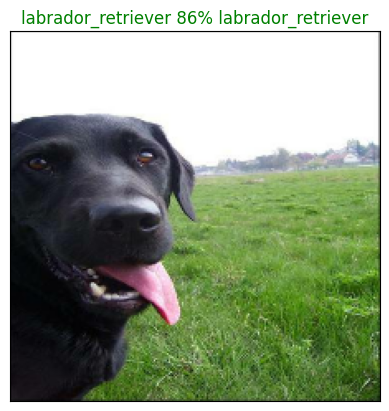

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n=40)

Now we've got one function to visualize our models top predictions, let's make another to view our maodels top 10 predictions.

Function will:
* Take an input of prediction probablities array, and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the truth label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences/probabilities along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labeles
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color= "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation= "vertical")
  # Change the colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

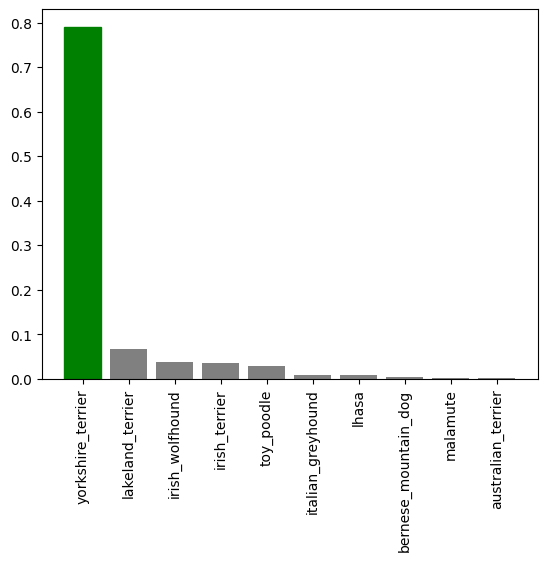

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n= 10)

Now we've got some functions to help us visualize and evaluate our model, let's check out a few.

In [ ]:
# Checking our a few predictions and their different values
def plot_pred_config_show_img(num_rows, num_cols, prediction_probabilities, labels,images, n=1):
  """
  Plot the predicted label, probability, true label and the image.
  Plot the top 10 predicted probabilities of the image.
  """
  i_multiplier = n
  num_images = num_rows * num_cols
  plt.figure(figsize= (10*num_cols, 5*num_rows))

  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities = prediction_probabilities,
              labels = labels,
              images = images,
              n= i+ i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities= prediction_probabilities,
                   labels = labels,
                   n= i+ i_multiplier)
  plt.tight_layout(h_pad= 1.0)
  plt.show()

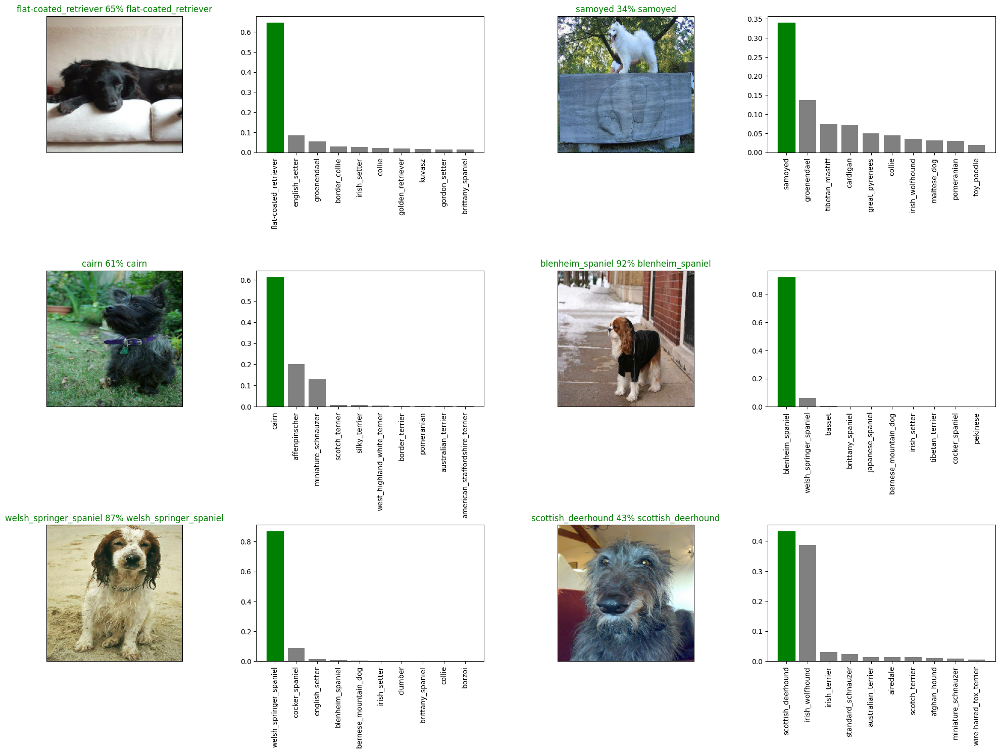

In [ ]:
plot_pred_config_show_img(num_rows = 3,
                          num_cols= 2,
                          prediction_probabilities= predictions,
                          labels = val_labels,
                          images = val_images,
                          n=20)

## Saving and reloading a trained model

In [ ]:
# Create a function to save our model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects= {"KerasLayer":hub.KerasLayer})
  return model

Noew we've got funcions to save and load a trained model. Demonstration

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230709-05161688879795-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230709-05161688879795-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20230709-05161688879795-1000-images-mobilenetv2-Adam.h5")

Loading saved model from:/content/drive/MyDrive/Dog Vision/models/20230709-05161688879795-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.2469 - accuracy: 0.6450


[1.2468926906585693, 0.6449999809265137]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 93ms/step - loss: 1.2469 - accuracy: 0.6450


[1.2468926906585693, 0.6449999809265137]

## Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating Training Data Batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model= create_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard= create_tensorboard_callback()

# No validation set when training on all the data, we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x= full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 42s 107ms/step - loss: 1.3313 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 35s 109ms/step - loss: 0.4016 - accuracy: 0.8783
Epoch 3/100
320/320 [==============================] - 35s 108ms/step - loss: 0.2380 - accuracy: 0.9330
Epoch 4/100
320/320 [==============================] - 35s 110ms/step - loss: 0.1515 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1048 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0763 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0586 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 35s 111ms/step - loss: 0.0475 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0365 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 38s 117m

## Saving the loading the full model

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230709-05321688880762-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230709-05321688880762-full-image-set-mobilenetv2-Adam.h5'

In [137]:
# Loading full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20230709-05321688880762-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from:/content/drive/MyDrive/Dog Vision/models/20230709-05321688880762-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

We've created `create_data_batches()` which can take a list of filenmaes as input and convert them into Tensor batches.

To make predictions on the test data we'll:

* Get the test imaeg filenames
* Convert the filenames into test batches using `create_data_batches()` and setting the `test_data` parameter to `true` (since test data got no labels).
* Make a predictions array by passing the test batches to `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 '/content/drive/MyDrive/Dog Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 '/content/drive/MyDrive/Dog Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 '/content/drive/MyDrive/Dog Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 '/content/drive/MyDrive/Dog Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 '/content/drive/MyDrive/Dog Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 '/content/drive/MyDrive/Dog Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 '/content/drive/MyDrive/Dog Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 1 hour.)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 37s 112ms/step


In [ ]:
test_predictions

array([[1.4093588e-11, 2.9033605e-12, 4.3636440e-15, ..., 5.3481037e-14,
        5.9430494e-10, 3.3068760e-11],
       [1.2979807e-06, 9.8455450e-07, 7.2838806e-09, ..., 5.6012528e-11,
        1.4032496e-08, 8.3855256e-11],
       [1.2416710e-11, 3.9403372e-07, 1.2160878e-08, ..., 7.8949631e-07,
        2.3331623e-10, 1.2144917e-10],
       ...,
       [2.8023535e-09, 8.8598395e-10, 1.7882542e-07, ..., 4.0792062e-12,
        4.3595236e-07, 5.1447474e-10],
       [4.5194163e-05, 8.2696158e-07, 7.5599340e-09, ..., 3.4728351e-09,
        2.1036310e-05, 2.6824837e-05],
       [1.5212652e-08, 1.2992275e-07, 3.1724085e-07, ..., 2.1750275e-03,
        6.1733028e-09, 9.4772142e-11]], dtype=float32)

In [ ]:
# Save predictions (Numpy Array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy Array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter= ",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each dog breed.

To get the data in this format, we'll:
* Create a pandas dataframe with an ID column as well as a column for each dog breed
* Add data to the id column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the dataframe as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns= ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]= test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,1.409359e-11,2.903360e-12,4.363644e-15,1.135628e-13,6.548936e-14,4.663405e-12,5.695776e-17,1.896038e-13,7.681698e-14,...,1.080914e-12,7.113820e-14,3.482773e-14,6.072086e-15,1.832529e-14,9.143726e-13,2.556348e-13,5.348104e-14,5.943049e-10,3.306876e-11
1,00102ee9d8eb90812350685311fe5890,1.297981e-06,9.845545e-07,7.283881e-09,2.319451e-10,1.251773e-07,2.129395e-09,6.042069e-07,1.037385e-07,4.042947e-09,...,1.643549e-09,3.531514e-07,1.942341e-09,4.031597e-07,2.330095e-08,3.668307e-08,1.770663e-04,5.601253e-11,1.403250e-08,8.385526e-11
2,0012a730dfa437f5f3613fb75efcd4ce,1.241671e-11,3.940337e-07,1.216088e-08,8.554899e-11,7.236337e-11,1.993352e-08,1.966514e-11,7.860497e-12,4.530748e-09,...,6.108243e-12,2.141507e-11,8.158874e-08,1.041822e-06,2.601131e-08,2.762470e-08,3.836121e-12,7.894963e-07,2.333162e-10,1.214492e-10
3,001510bc8570bbeee98c8d80c8a95ec1,5.102735e-07,1.603601e-07,1.287916e-06,5.453954e-06,3.823756e-05,1.993292e-05,3.705073e-12,1.236156e-09,1.279834e-08,...,4.519823e-06,3.244199e-10,1.408315e-05,9.904941e-10,4.635219e-07,6.313750e-10,1.747829e-14,9.201438e-03,4.631852e-11,3.494617e-08
4,001a5f3114548acdefa3d4da05474c2e,5.082494e-06,2.869091e-06,4.790234e-09,3.282355e-10,3.014743e-10,5.818538e-12,5.808750e-11,3.543386e-09,1.459780e-09,...,4.493621e-08,6.285994e-11,2.205531e-11,6.266230e-11,1.797509e-10,3.116576e-10,5.021305e-11,5.316101e-08,1.009708e-10,1.759244e-08


In [144]:
# Save our predictions dataframe to CSV for submission on Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_mobilenetv2.csv",
                index= False)

## Making predictions on custom images

To make predictions on custom images, we'll :
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. Since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [162]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [163]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/my-dog-photos/download (2).jpeg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/download.jpeg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/download (1).jpeg']

In [164]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [165]:
# Make predictions on the custom data
custom_preds= loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 529ms/step


In [166]:
custom_preds.shape

(3, 120)

In [167]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['boxer', 'rottweiler', 'german_shepherd']

In [168]:
# Get custom images (our batchify() won't work since there aren't labels
custom_images = []
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

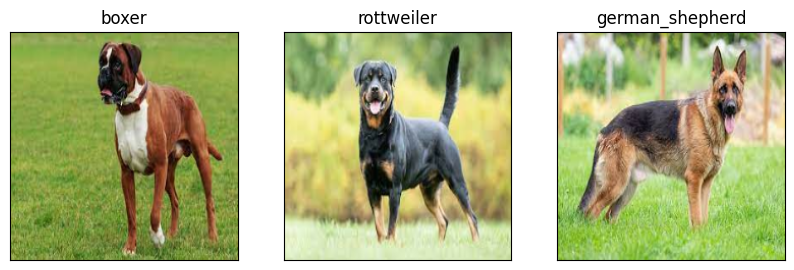

In [169]:
# Check custom image predictions
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [183]:
def custom_image_predictions():
  # Get custom image filepaths
  custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
  custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
  custom_image_paths = []
  for fname in os.listdir(custom_path):
    if (fname== '.ipynb_checkpoints'):
      continue
    custom_image_paths.append(custom_path + fname)
  # Turn custom images into batch dataset
  custom_data = create_data_batches(custom_image_paths, test_data= True)
  # Make predictions on the custom data
  custom_preds= loaded_full_model.predict(custom_data)
  # Get custom image prediction labels
  custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
  # Get custom images (our batchify() won't work since there aren't labels
  custom_images = []
  # loop through unbatched data
  for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)
  # Check custom image predictions
  plt.figure(figsize = (10, 10))
  for i, image in enumerate(custom_images):
    plt.subplot(len(custom_images)%5, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)

In [ ]:
# Upload the images in my-dog-photos folder in Dog Vision in Google drive, and then run this cell.
custom_image_predictions()